# LENDING CLUB CASE STUDY
## High-level Objective
### To figure out the driving factors that can possibly lead to a debtor defaulting on their loan payments from the given dataset

#### We start off with importing all the necessary libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
import plotly.io as pio

In [2]:
#Importing the figure factory for composite graphs
import plotly.figure_factory as ff

#### We also set some initial configuration in terms of visualization and formatting

In [3]:
#To enable inline view of 
%matplotlib inline 

#To enable seamless autocomplete on Tab
%config Completer.use_jedi = False 

#To ignore warnings and errors while executing code
warnings.filterwarnings("ignore") 

#To prevent truncation of columns while viewing a data set
pd.set_option('display.max_columns', None)

#To prevent truncation of rows while viewing a data set
pd.set_option('display.max_rows', None)

#To help persist Plotly graphs
pio.renderers.default='notebook'

### Loading the raw dataset and viewing the records and metadata

In [4]:
loan = pd.read_csv('loan.csv')
loan.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [5]:
#Viewing the metadata for the given dataset
loan.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

## DATA CLEANING

As we can see, the given dataset contains around 111 columns, several of which are either entirely, predominantly or significantly having null or missing values (more than 30%). Apart from this there are columns with single values and also those mirroring duplicate values from other columns. So, we will proceed with removing these columns one by one

In [6]:
#Checking percentage of missing or null values in the columns of the dataset
percent_missing = loan.isnull().sum() * 100 / len(loan)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})

#Arranging them in descending order so that the ones with higher percentage are displayed on top
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
missing_value_df

,percent_missing
verification_status_joint,100.000000
annual_inc_joint,100.000000
mo_sin_old_rev_tl_op,100.000000
mo_sin_old_il_acct,100.000000
bc_util,100.000000
bc_open_to_buy,100.000000
avg_cur_bal,100.000000
acc_open_past_24mths,100.000000
inq_last_12m,100.000000
total_cu_tl,100.000000


#### We list the columns to be removed that have missing values above 30% and the total count of this list

In [7]:
cols_to_be_removed = list(missing_value_df[missing_value_df.percent_missing > 30].index)
print('Number of columns to be removed: ',len(cols_to_be_removed))
print('List of columns to be removed:\n', cols_to_be_removed)

Number of columns to be removed:  58
List of columns to be removed:
 ['verification_status_joint', 'annual_inc_joint', 'mo_sin_old_rev_tl_op', 'mo_sin_old_il_acct', 'bc_util', 'bc_open_to_buy', 'avg_cur_bal', 'acc_open_past_24mths', 'inq_last_12m', 'total_cu_tl', 'inq_fi', 'total_rev_hi_lim', 'all_util', 'max_bal_bc', 'open_rv_24m', 'open_rv_12m', 'il_util', 'total_bal_il', 'mths_since_rcnt_il', 'open_il_24m', 'open_il_12m', 'open_il_6m', 'open_acc_6m', 'tot_cur_bal', 'tot_coll_amt', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc', 'num_rev_tl_bal_gt_0', 'total_bc_limit', 'total_bal_ex_mort', 'tot_hi_cred_lim', 'percent_bc_gt_75', 'pct_tl_nvr_dlq', 'num_tl_op_past_12m', 'num_tl_90g_dpd_24m', 'num_tl_30dpd', 'num_tl_120dpd_2m', 'num_sats', 'num_rev_accts', 'mths_since_recent_bc', 'num_op_rev_tl', 'num_il_tl', 'num_bc_tl', 'num_bc_sats', 'num_actv_rev_tl', 'num_actv_bc_tl', 'num_accts_ever_120_pd', 'mths_since_recent_revol_delinq', 'mths_since_recent_inq', 'mths_since_recent_bc_dlq

In [8]:
#Removing the above mentioned columns
loan_clean = loan.drop(cols_to_be_removed, axis=1)
loan_clean.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,car,bike,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,other,personel,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://lendingclub.com/browse/loanDetail.acti...,other,Personal,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.90%,38,f,524.06,524.06,3513.330000,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


### Performing null checks and cleaning further

In [9]:
#Checking percentage of missing or null values in the columns of the dataset
percent_missing = loan_clean.isnull().sum() * 100 / len(loan_clean)
missing_value_df = pd.DataFrame({'percent_missing': percent_missing})

#Arranging them in descending order so that the ones with higher percentage are displayed on top
missing_value_df.sort_values('percent_missing', inplace=True, ascending=False)
missing_value_df

,percent_missing
emp_title,6.191303
emp_length,2.706650
pub_rec_bankruptcies,1.754916
last_pymnt_d,0.178765
collections_12_mths_ex_med,0.140998
chargeoff_within_12_mths,0.140998
revol_util,0.125891
tax_liens,0.098195
title,0.027696
last_credit_pull_d,0.005036


### Given the maximum percentage missing values are around 6% now for the columns, we can safely proceed with removing these rows as we will still retain around 94% of the datatset for our analysis

In [10]:
#Dropping null valued rows and examining the metadata for the resultant dataset
loan_clean = loan_clean.dropna()
loan_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36431 entries, 1 to 39623
Data columns (total 53 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          36431 non-null  int64  
 1   member_id                   36431 non-null  int64  
 2   loan_amnt                   36431 non-null  int64  
 3   funded_amnt                 36431 non-null  int64  
 4   funded_amnt_inv             36431 non-null  float64
 5   term                        36431 non-null  object 
 6   int_rate                    36431 non-null  object 
 7   installment                 36431 non-null  float64
 8   grade                       36431 non-null  object 
 9   sub_grade                   36431 non-null  object 
 10  emp_title                   36431 non-null  object 
 11  emp_length                  36431 non-null  object 
 12  home_ownership              36431 non-null  object 
 13  annual_inc                  364

#### We list the columns that have only single values present in them and remove them

In [11]:
single_value_columns = [c for c in list(loan_clean.columns) if len(loan_clean[c].unique()) <= 1]
print('Number of Single Value columns: ',len(single_value_columns))
print('List of columns to be removed:\n', single_value_columns)

Number of Single Value columns:  9
List of columns to be removed:
 ['pymnt_plan', 'initial_list_status', 'collections_12_mths_ex_med', 'policy_code', 'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt', 'tax_liens']


In [12]:
#Removing the above mentioned columns
loan_clean = loan_clean.drop(single_value_columns, axis=1)
loan_clean.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,url,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,https://lendingclub.com/browse/loanDetail.acti...,car,bike,309xx,GA,1.00,0,Apr-99,5,3,0,1687,9.40%,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,Sep-13,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,other,personel,917xx,CA,20.00,0,Feb-96,1,10,0,5598,21%,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,Apr-16,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,https://lendingclub.com/browse/loanDetail.acti...,other,Personal,972xx,OR,17.94,0,Jan-96,0,15,0,27783,53.90%,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,May-16,67.79,May-16,0.0
5,1075269,1311441,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,Veolia Transportaton,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,wedding,My wedding loan I promise to pay back,852xx,AZ,11.20,0,Nov-04,3,9,0,7963,28.30%,12,0.00,0.00,5632.21,5632.21,5000.00,632.21,0.00,0.00,0.00,Jan-15,161.03,Jan-16,0.0
6,1069639,1304742,7000,7000,7000.0,60 months,15.96%,170.08,C,C5,Southern Star Photography,8 years,RENT,47004.0,Not Verified,Dec-11,Fully Paid,https://lendingclub.com/browse/loanDetail.acti...,debt_consolidation,Loan,280xx,NC,23.51,0,Jul-05,1,7,0,17726,85.60%,11,0.00,0.00,10110.84,10110.84,6985.61,3125.23,0.00,0.00,0.00,May-16,1313.76,May-16,0.0


#### There are some columns that do not represent a user's risk taking capability and are irrelevant to our analysis. A list of such columns are as follows:
- id
- member_id
- emp_title
- issue_d
- url
- title
- zip_code
- earliest_cr_line
- last_pymnt_d
- last_credit_pull_d

In [13]:
#Removing columns that do not represent a user's risk taking capability
cols_to_be_removed = ['id','member_id','emp_title','issue_d','url','title','zip_code','earliest_cr_line','last_pymnt_d','last_credit_pull_d']
loan_clean = loan_clean.drop(cols_to_be_removed, axis=1)
loan_clean.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.40%,4,0.00,0.00,1008.71,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21%,37,0.00,0.00,12231.89,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0
4,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.90%,38,524.06,524.06,3513.33,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0
5,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.30%,12,0.00,0.00,5632.21,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0
6,7000,7000,7000.0,60 months,15.96%,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.60%,11,0.00,0.00,10110.84,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0


#### There are a few columns that are technically clear repetitions of their adjacent columns. Such columns are:
- funded_amnt_inv (repetition from loan_amnt)
- funded_amnt (repetition from loan_amnt)
- total_pymnt_inv (repetition from total_pymnt)
- out_prncp_inv (repetition from out_prncp)

In [14]:
#Removing funded_amnt_inv,total_pymnt_inv,out_prncp_inv as they are technically repetitions of their parent columns
loan_clean = loan_clean.drop(['funded_amnt','funded_amnt_inv','total_pymnt_inv','out_prncp_inv'], axis=1)
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
1,2500,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.40%,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0
3,10000,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21%,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0
4,3000,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.90%,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0
5,5000,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.30%,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0
6,7000,60 months,15.96%,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.60%,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0


In [15]:
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies
1,2500,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.40%,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0
3,10000,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21%,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0
4,3000,60 months,12.69%,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.90%,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0
5,5000,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.30%,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0
6,7000,60 months,15.96%,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.60%,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0


### We can see that the columns: _term_, _int_rate_ and _revol_util_ are of type string (i.e. alphanumeric) so we will be converting them to numeric values for better analysis

In [16]:
#Cleaning revol_util and int_rate columns by converting it to float values
loan_clean['revol_util'] = loan_clean.revol_util.apply(lambda v:float(v.split('%')[0]))
loan_clean['int_rate'] = loan_clean.int_rate.apply(lambda v:float(v.split('%')[0]))

In [17]:
#Displaying dataset info
loan_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36431 entries, 1 to 39623
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   loan_amnt                36431 non-null  int64  
 1   term                     36431 non-null  object 
 2   int_rate                 36431 non-null  float64
 3   installment              36431 non-null  float64
 4   grade                    36431 non-null  object 
 5   sub_grade                36431 non-null  object 
 6   emp_length               36431 non-null  object 
 7   home_ownership           36431 non-null  object 
 8   annual_inc               36431 non-null  float64
 9   verification_status      36431 non-null  object 
 10  loan_status              36431 non-null  object 
 11  purpose                  36431 non-null  object 
 12  addr_state               36431 non-null  object 
 13  dti                      36431 non-null  float64
 14  delinq_2yrs           

### Post cleanup, we are now left with 30 non-null columns (9 categorical, 21 quantitative), 36431 non-null entries for our analysis to begin

## ANALYSES

### Distribution of different types of Loan status

In [18]:
#Checking Loan Status distribution
fig = px.histogram(loan_clean, x="loan_status", color="loan_status",color_discrete_sequence=px.colors.qualitative.Set2, title="Distribution of different types of Loan status")
fig.show()

In [19]:
#Checking Loan Status distribution as a pie chart
loan_status_count = loan_clean.loan_status.value_counts()
fig = px.pie(loan_status_count, values='loan_status', color_discrete_sequence=px.colors.qualitative.Set2, names=loan_status_count.index, title="Percentage Distribution of different types of Loan status")
fig.show()

As we can see, around 4942 entries (13.6% of the cleaned dataset) are Charged-Off loans. Lets proceed with other distributions

### Before proceeding, based on the business understanding provided, we would add a new column 'is_defaulter' to strictly bifurcate between defaulters and non-defaulters. Only _Charged-off_ entries are considered as defaulters as per the problem statement

In [20]:
#adding a new column for checking defaulter
loan_clean['is_defaulter'] = loan_clean.loan_status.apply(lambda s: 'YES' if s == 'Charged Off' else 'NO')
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,is_defaulter
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.4,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0,YES
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21.0,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0,NO
4,3000,60 months,12.69,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.9,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0,NO
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.3,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0,NO
6,7000,60 months,15.96,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.6,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0,NO


### Distribution of different kinds of Income Source Verification status based on defaulting type 

In [21]:
#Checking Verification Status distribution
fig = px.histogram(loan_clean, x="verification_status", color="is_defaulter",color_discrete_sequence=px.colors.qualitative.Set2, title="Distribution of different kinds of Income Source Verification types by defaulting type")
fig.show()

For better clarity, let us consider only the set of defaulters and check their income source verification distribution

In [22]:
default_loans = loan_clean[loan_clean.is_defaulter == 'YES']

In [23]:
#Checking Verification Status distribution
fig = px.histogram(default_loans, x="verification_status", color="verification_status", color_discrete_sequence=px.colors.qualitative.Set2, title="Distribution of different kinds of Income Source Verification types for defaulted loans")
fig.show()

### It is important to note here that having income verified and income-source verified are not the one and same thing. Income verification deals with only the amount being received as a regular income regardless of the source, while Income Source verification also additionally deals with verifying and legitimizing the source of income as well

### Therefore, we will create another column called _is_income_source_verified_

In [24]:
#adding a new column for checking income source
loan_clean['is_income_src_verified'] = loan_clean.verification_status.apply(lambda s: s if s == 'Source Verified' else 'Source Not Verified')
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,is_defaulter,is_income_src_verified
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.4,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0,YES,Source Verified
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21.0,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0,NO,Source Verified
4,3000,60 months,12.69,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.9,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0,NO,Source Verified
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.3,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0,NO,Source Verified
6,7000,60 months,15.96,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.6,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0,NO,Source Not Verified


In [25]:
#Checking Income Source verification distribution as a pie chart
verification_count = loan_clean.verification_status.value_counts()
fig = px.pie(verification_count, values='verification_status', color_discrete_sequence=px.colors.qualitative.Set2, names=verification_count.index, title="Percentage Distribution of Income Source Verification status")
fig.show()

In [26]:
#Checking Income Source verification distribution for defaulted loans as a pie chart
verification_count = loan_clean[loan_clean.is_defaulter == 'YES'].verification_status.value_counts()
fig = px.pie(verification_count, values='verification_status', color_discrete_sequence=px.colors.qualitative.Set2, names=verification_count.index, title="Percentage Distribution of Income Source Verification status for Defaulters")
fig.show()

In [27]:
#Checking Income Source verification distribution for non-defaulted loans as a pie chart
verification_count = loan_clean[loan_clean.is_defaulter == 'NO'].verification_status.value_counts()
fig = px.pie(verification_count, values='verification_status', color_discrete_sequence=px.colors.qualitative.Set2, names=verification_count.index, title="Percentage Distribution of Income Source Verification status for Non-defaulters")
fig.show()

### Checking annual income distribution for the loan applications

In [28]:
#checking the distribution of Annual Income by loan default status
fig = px.box(loan_clean, y="annual_inc",title="Distribution of Annual Income by loan default status")
fig.show()

#### As evident, the data contains a lot of outliers. Therefore we can consider the data upto the 90th percentile for understanding the distribution better

In [29]:
#checking the distribution of Annual Income upto 90th percentile by loan default status
fig = px.box(loan_clean[loan_clean.annual_inc <= loan_clean.annual_inc.quantile(0.9)], y="annual_inc",color="is_defaulter",title="Distribution of Annual Income (90th percentile) by loan default status")
fig.show()

In [30]:
#Checking Annual income distribution of defaulters within the 90th percentile
fig = px.histogram(
    loan_clean[loan_clean.annual_inc <= loan_clean.annual_inc.quantile(0.9)][loan_clean.is_defaulter == 'YES'], 
    x="annual_inc",
    nbins=50,
    color_discrete_sequence=px.colors.qualitative.Set1, 
    title="Distribution of Annual Income within the 90th percentile for the defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

In [31]:
#Checking Annual income distribution of non-defaulters within the 90th percentile
fig = px.histogram(
    loan_clean[loan_clean.annual_inc <= loan_clean.annual_inc.quantile(0.9)][loan_clean.is_defaulter == 'NO'], 
    x="annual_inc",
    nbins=50,
    color_discrete_sequence=px.colors.qualitative.Set2, 
    title="Distribution of Annual Income within the 90th percentile for the non-defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

### CONCLUSION: There is an additional peak to the lesser income group of USD 37.5k - 42.5k range for the defaulters as compared to the non-defaulters, who have a clear and distint peak at USD 47.5k - 52.5K range only

### Checking employment length distribution of defaulters

In [32]:
#Checking employment length distribution of defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'YES'].sort_values('emp_length',ascending=False), 
    x="emp_length",
    nbins=50,
    color_discrete_sequence=px.colors.qualitative.Set1, 
    title="Distribution of Employment length for the defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

### Checking employment length distribution of non-defaulters

In [33]:
#Checking employment length distribution of non-defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'NO'].sort_values('emp_length',ascending=False), 
    x="emp_length",
    nbins=50,
    color_discrete_sequence=px.colors.qualitative.Set2, 
    title="Distribution of Employment length for the non-defaulting loan applications",
)
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

### CONCLUSION: No observable difference in employment length distribution between defaulters and non-defaulters

### Checking interest rate distribution for the loan applications ¶

In [34]:
#Checking interest rate distribution of defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'YES'], 
    x="int_rate",
    nbins=50,
    color_discrete_sequence=px.colors.qualitative.Set1, 
    title="Distribution of Interest rate for the defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

In [35]:
#Checking interest rate distribution of non-defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'NO'], 
    x="int_rate",
    nbins=50,
    color_discrete_sequence=px.colors.qualitative.Set2, 
    title="Distribution of Interest rate for the non-defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

### CONCLUSION: There is a clear difference in the loan interest rate distribution of defaulters and non-defaulters. There is clear peaking in the (7.5 - 8)% and (10.5 - 11)% ranges for the defaulters as compared to the non-defaulters, who have a clear peak at the (12.5 - 13.5)% range. Therefore, higher interest rates can have a greater indication of default

### Checking DTI rate distribution for the loan applications

In [36]:
#Checking dti rate distribution of defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'YES'], 
    x="dti",
    nbins=200,
    color_discrete_sequence=px.colors.qualitative.Set1, 
    title="Distribution of DTI rate for the defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

In [37]:
#Checking dti rate distribution of non-defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'NO'], 
    x="dti",
    nbins=200,
    color_discrete_sequence=px.colors.qualitative.Set2, 
    title="Distribution of DTI rate for the non-defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

### CONCLUSION: For DTI rates, there is clear peaking in the (16.5 - 16.7)% ranges for the defaulters as compared to the non-defaulters, who have a clear peak at the (12.5 - 12.7)% range. Therefore, higher DTI rates can have a greater indication of default

### Checking Credit Revolution Utilisation rate distribution for the loan applications 

In [38]:
#Checking revol_util rate distribution of defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'YES'], 
    x="revol_util",
    nbins=20,
    color_discrete_sequence=px.colors.qualitative.Set1, 
    title="Distribution of Credit Revolution Utilisation rate for the defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

In [39]:
#Checking revol_util rate distribution of non-defaulters
fig = px.histogram(
    loan_clean[loan_clean.is_defaulter == 'NO'], 
    x="revol_util",
    nbins=20,
    color_discrete_sequence=px.colors.qualitative.Set2, 
    title="Distribution of Credit Revolution Utilisation rate for the non-defaulting loan applications")
fig.update_traces(marker_line_width=1,marker_line_color="white")
fig.show()

### CONCLUSION: For Credit Revolution Utilization rates, there is clear peaking in the (62.5 - 67.5)% ranges for the defaulters as compared to the non-defaulters, who have a clear peak at the (47.5 - 52.5)% range. Therefore, higher Credit Revolution Utilization rates can have a greater indication of default

In [40]:
#Checking loan data
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,is_defaulter,is_income_src_verified
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.4,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0,YES,Source Verified
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21.0,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0,NO,Source Verified
4,3000,60 months,12.69,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.9,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0,NO,Source Verified
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.3,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0,NO,Source Verified
6,7000,60 months,15.96,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.6,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0,NO,Source Not Verified


### Checking home ownership status for the loan records 

In [41]:
#Checking Home Ownership distribution as a pie chart
ownership_count = loan_clean.home_ownership.value_counts()
fig = px.pie(ownership_count, values='home_ownership', color_discrete_sequence=px.colors.qualitative.Set2, names=ownership_count.index, title="Percentage Distribution of Home Ownership")
fig.show()

In [42]:
#Checking Home Ownership distribution as a pie chart for defaulters
ownership_count = loan_clean[loan_clean.is_defaulter == 'YES'].home_ownership.value_counts()
fig = px.pie(ownership_count, values='home_ownership', color_discrete_sequence=px.colors.qualitative.Set2, names=ownership_count.index, title="Percentage Distribution of Home Ownership for Defaulters")
fig.show()

In [43]:
#Checking Home Ownership distribution as a pie chart for non-defaulters
ownership_count = loan_clean[loan_clean.is_defaulter == 'NO'].home_ownership.value_counts()
fig = px.pie(ownership_count, values='home_ownership', color_discrete_sequence=px.colors.qualitative.Set2, names=ownership_count.index, title="Percentage Distribution of Home Ownership for Non-defaulters")
fig.show()

### CONCLUSION: It seems the defaulters are 3.4% more likely to stay in rented houses more than other loan takers

## Checking loan term distribution for the loan records¶

In [44]:
#Checking Loan term distribution as a pie chart
term_count = loan_clean.term.value_counts()
fig = px.pie(
    term_count, 
    values='term', 
    color_discrete_sequence=px.colors.qualitative.Set2, 
    names=term_count.index, 
    title="Percentage Distribution of Loan term")
fig.show()

In [45]:
#Checking Loan term distribution as a pie chart for defaulters
term_count = loan_clean[loan_clean.is_defaulter == 'YES'].term.value_counts()
fig = px.pie(
    term_count, 
    values='term', 
    color_discrete_sequence=px.colors.qualitative.Set2, 
    names=term_count.index, 
    title="Percentage Distribution of Loan term for defaulters")
fig.show()

In [46]:
#Checking Loan term distribution as a pie chart for non-defaulters
term_count = loan_clean[loan_clean.is_defaulter == 'NO'].term.value_counts()
fig = px.pie(
    term_count, 
    values='term', 
    color_discrete_sequence=px.colors.qualitative.Set2, 
    names=term_count.index, 
    title="Percentage Distribution of Loan term for non-defaulters")
fig.show()

### CONCLUSION: It can be concluded that the defaulters are 20% more likely  to avail a longer term of 60 months more as compared to non-defaulters

## Checking Grade distribution for the loan records

In [47]:
#Checking high-level Grade distribution for all Loans
loans_sg_sorted = loan_clean.sort_values('sub_grade', ascending=True)
count_df = loans_sg_sorted.grade.value_counts()
fig = px.pie(count_df, values="grade", names=count_df.index,title="High-level distribution of Grades for all loans")
fig.show()

In [48]:
#Checking high-level Grade distribution for default loans
co_loans_sg_sorted = loan_clean[loan_clean.is_defaulter == 'YES'].sort_values('sub_grade', ascending=True)
count_df = co_loans_sg_sorted.grade.value_counts()
fig = px.pie(count_df, values="grade", names=count_df.index,title="High-level distribution of Grades for defaulted loans")
fig.show()

In [49]:
#Checking high-level Grade distribution for non-default loans
nd_loans_sg_sorted = loan_clean[loan_clean.is_defaulter == 'NO'].sort_values('sub_grade', ascending=True)
count_df = nd_loans_sg_sorted.grade.value_counts()
fig = px.pie(count_df, values="grade", names=count_df.index,title="High-level distribution of Grades for non-defaulted loans")
fig.show()

In [50]:
#Checking subgrade distribution for all Loans

fig = px.histogram(loans_sg_sorted, x="grade", color="sub_grade",title="Granular distribution of Grades for all loans")
fig.show()

In [51]:
#Checking subgrade distribution for defaulted Loans

fig = px.histogram(co_loans_sg_sorted, x="grade", color="sub_grade",title="Granular distribution of Grades for defaulted loans")
fig.show()

In [52]:
#Checking subgrade distribution for non-defaulted Loans

fig = px.histogram(nd_loans_sg_sorted, x="grade", color="sub_grade",title="Granular distribution of Grades for non-defaulted loans")
fig.show()

### CONCLUSION: Defaulters tend to belong more to lower grades such as C,D,E etc as compared to higher grades i.e. A or B. However at the sub-grade level there is no clear pattern as such for lower grade debtors. In higher grade debtors i.e. A and B, the lower the subgrade the more the tendency to default

## Checking Loan Purpose distribution for the loan records

In [53]:
#Checking Loan Purpose distribution as a pie chart
data_count = loan_clean.purpose.value_counts()
fig = px.pie(
    data_count, 
    values='purpose', 
    color_discrete_sequence=px.colors.qualitative.Set2, 
    names=data_count.index, 
    title="Percentage Distribution of Loan Purpose for all records")
fig.show()

In [54]:
#Checking Loan Purpose distribution as a pie chart for defaulters
data_count = loan_clean[loan_clean.is_defaulter == 'YES'].purpose.value_counts()
fig = px.pie(
    data_count, 
    values='purpose', 
    color_discrete_sequence=px.colors.qualitative.Set2, 
    names=data_count.index, 
    title="Percentage Distribution of Loan Purpose for defaulter records")
fig.show()

In [55]:
#Checking Loan Purpose distribution as a pie chart for non-defaulters
data_count = loan_clean[loan_clean.is_defaulter == 'NO'].purpose.value_counts()
fig = px.pie(
    data_count, 
    values='purpose', 
    color_discrete_sequence=px.colors.qualitative.Set2, 
    names=data_count.index, 
    title="Percentage Distribution of Loan Purpose for non-defaulter records")
fig.show()

### CONCLUSION: Therefore, we can conclude that defaulters tend to take loans more for Debt Consolidation and Other unlisted purposes than others

### Checking State of Residence distribution for the loan records

In [56]:
#Checking State of residence distribution for all loans
count_df = loan_clean.addr_state.value_counts()
count_df.sort_values(ascending=False,inplace=True)
top10states = count_df.iloc[0:10].sort_values(ascending=False)
fig = px.bar(top10states, x="addr_state", y=top10states.index, color=top10states.index, orientation='h',
             title='Distribution of Top 10 US States that have the most loan records')
fig.show()

In [57]:
#Checking State of residence distribution for defaulted loans
count_df = loan_clean[loan_clean.is_defaulter == 'YES'].addr_state.value_counts()
count_df.sort_values(ascending=False,inplace=True)
top10states = count_df.iloc[0:10].sort_values(ascending=False)
fig = px.bar(top10states, x="addr_state", y=top10states.index, color=top10states.index, orientation='h',
             title='Distribution of Top 10 US States that have the most defaulter loan records')
fig.show()

In [58]:
#Checking State of residence distribution for not defaulted loans
count_df = loan_clean[loan_clean.is_defaulter == 'NO'].addr_state.value_counts()
count_df.sort_values(ascending=False,inplace=True)
top10states = count_df.iloc[0:10].sort_values(ascending=False)
fig = px.bar(top10states, x="addr_state", y=top10states.index, color=top10states.index, orientation='h',
             title='Distribution of Top 10 US States that have the most non-defaulter loan records')
fig.show()

### CONCLUSION: While the states of California and New York dominates for the most number of defaulters as well as the non-defaulters, records from Florida almost equals New York in terms of defaulters, supplanting Texas which is the 3rd largest for non-defaulters . Therefore, if there is an increase in the proportion of applicants from Florida then there might be some possibility of default

In [59]:
#Viewing the dataset again
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,is_defaulter,is_income_src_verified
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.4,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0,YES,Source Verified
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21.0,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0,NO,Source Verified
4,3000,60 months,12.69,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.9,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0,NO,Source Verified
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.3,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0,NO,Source Verified
6,7000,60 months,15.96,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.6,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0,NO,Source Not Verified


We will proceed with creating a function for generating composite histograms and distplots

In [60]:
def create_composite_distplot(
    x1,x2,
    bin_size=.5,
    group_labels = ['Group 1', 'Group 2'],
    #colors = ['slategray', 'magenta'],
    title_text='Distplot with Normal Distribution',
    curve_type='kde'):
    # Create distplot with curve_type set to 'normal'
    fig = ff.create_distplot([x1, x2], group_labels, bin_size=bin_size,
                             curve_type=curve_type) # override default 'kde'
                             #colors=colors)

    # Add title
    fig.update_layout(title_text=title_text)
    fig.show()

Creating separate datasets for defaulters and non-defaulters

In [61]:
loan_defaulter = loan_clean[loan_clean.is_defaulter == 'YES']
loan_non_defaulter = loan_clean[loan_clean.is_defaulter == 'NO']

### Comparing loan amount distribution for both defaulters and non-defaulters

In [62]:
#Comparing loan amount distribution for both defaulters and non-defaulters
create_composite_distplot(
    loan_defaulter.loan_amnt,
    loan_non_defaulter.loan_amnt,
    bin_size=1000,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of loan amounts for defaulters and non-defaulters',
    curve_type='kde'
)

### CONCLUSION: It is also observed from above that for higher loan amounts there are more takers from Defaulters than Non-defaulters, especially between USD 15k to 30k

### Comparing monthly installments distribution for both defaulters and non-defaulters

In [63]:
#Comparing monthly installments distribution for both defaulters and non-defaulters
create_composite_distplot(
    loan_defaulter.installment,
    loan_non_defaulter.installment,
    bin_size=50,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of monthly installments for defaulters and non-defaulters',
    curve_type='kde'
)

### CONCLUSION: As a corollary from the previous plot, more non-defaulters tend to pay lesser EMIs than defaulters

### Comparing revolving credit balance distribution for both defaulters and non-defaulters

In [64]:
#Comparing revolving credit balance distribution for both defaulters and non-defaulters
create_composite_distplot(
    loan_defaulter.revol_bal,
    loan_non_defaulter.revol_bal,
    bin_size=5000,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of revolving credit balance for defaulters and non-defaulters',
    curve_type='kde'
)

It seems that there are a lot of outliers here. So let us represent the data upto the 75th percentile and check

In [65]:
#Comparing revolving credit balance distribution for both defaulters and non-defaulters (upto 75th percentile)
create_composite_distplot(
    loan_defaulter[loan_defaulter.revol_bal <= loan_defaulter.revol_bal.quantile(0.75)].revol_bal,
    loan_non_defaulter[loan_non_defaulter.revol_bal <= loan_non_defaulter.revol_bal.quantile(0.75)].revol_bal,
    bin_size=200,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of revolving credit balance for defaulters and non-defaulters',
    curve_type='kde'
)

### CONCLUSION: It seems that non-defaulters tend to have lower total revolving credit balance than defaulters

In [66]:
#Listing the columns of the dataset again
loan_clean.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'loan_status', 'purpose', 'addr_state', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'out_prncp', 'total_pymnt', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_amnt', 'pub_rec_bankruptcies',
       'is_defaulter', 'is_income_src_verified'],
      dtype='object')

### Comparing Total Payment amount received to date (paid off) as apart of the loan

In [67]:
#Comparing Total Payment amount received to date for both defaulters and non-defaulters
create_composite_distplot(
    loan_defaulter.total_pymnt,
    loan_non_defaulter.total_pymnt,
    bin_size=1000,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of Total Payment amount received to date for defaulters and non-defaulters',
    curve_type='kde'
)

### CONCLUSION: As we can see for lower amounts, the number of payments by defaulters is significantly higher than non-defaulters that tends to be lesser for higher amounts

### Comparing the distribution of Total Principle received for both defaulters and non-defaulters

In [68]:
#Comparing the distribution of Total Principle received for both defaulters and non-defaulters
create_composite_distplot(
    loan_defaulter.total_rec_prncp,
    loan_non_defaulter.total_rec_prncp,
    bin_size=1000,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of Total Principle received to date for defaulters and non-defaulters',
    curve_type='kde'
)

### CONCLUSION: The no of defaulters who pay less principal amount are much higher than the non-defaulters

In [69]:
#Comparing the distribution of Total Interest received for both defaulters and non-defaulters
create_composite_distplot(
    loan_defaulter.total_rec_int,
    loan_non_defaulter.total_rec_int,
    bin_size=1000,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of Total Interest received to date for defaulters and non-defaulters',
    curve_type='kde'
)

### As this data seems to have a lot of outliers we will check it within the 75th percentile

In [70]:
#Comparing the distribution of Total Interest received for both defaulters and non-defaulters in the 75th percentile
create_composite_distplot(
    loan_defaulter[loan_defaulter.total_rec_int <= loan_defaulter.total_rec_int.quantile(0.75)].total_rec_int,
    loan_non_defaulter[loan_non_defaulter.total_rec_int <= loan_non_defaulter.total_rec_int.quantile(0.75)].total_rec_int,
    bin_size=100,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of Total Interest received to date for defaulters and non-defaulters in the 75th percentile',
    curve_type='kde'
)

### CONCLUSION: There is no observable difference in the total interest received even within the 75th percentile

### Comparing the distribution of last total payment amount received for both defaulters and non-defaulters within the 75th percentile

In [71]:
#Comparing the distribution of last total payment amount received for both defaulters and non-defaulters
create_composite_distplot(
    loan_defaulter[loan_defaulter.last_pymnt_amnt <= loan_defaulter.last_pymnt_amnt.quantile(0.75)].last_pymnt_amnt,
    loan_non_defaulter[loan_non_defaulter.last_pymnt_amnt <= loan_non_defaulter.last_pymnt_amnt.quantile(0.75)].last_pymnt_amnt,
    bin_size=10,
    group_labels = ['Defaulters', 'Non-defaulters'],
    title_text='Distplot of last total payment amount received to date for defaulters and non-defaulters',
    curve_type='kde'
)

### CONCLUSION: As we can observe, even within the 75th percentile, the last total payment amount received is disproportionally higher from defaulters than non-defaulters upto around USD 500, but abruptly stops beyond that while the no of non-defaulters, albeit reduced, continue for higher values of the amount

In [72]:
#checking the dataset again
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,is_defaulter,is_income_src_verified
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.4,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0,YES,Source Verified
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21.0,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0,NO,Source Verified
4,3000,60 months,12.69,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.9,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0,NO,Source Verified
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.3,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0,NO,Source Verified
6,7000,60 months,15.96,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.6,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0,NO,Source Not Verified


## Examining compliance level metrics for the loan records 

##### For the first level of checks  we group the following by the defaulter status:
- delinq_2yrs
- inq_last_6mths
- open_acc
- pub_rec
- total_acc
- pub_rec_bankruptcies

In [73]:
#Checking max, min, counts of records by defaulter status
loan_compliance_data = loan_clean[['is_defaulter','delinq_2yrs','inq_last_6mths','total_acc','open_acc','pub_rec','pub_rec_bankruptcies']]
loan_compliance_data.groupby('is_defaulter').agg(['min','max','count'])

delinq_2yrs            inq_last_6mths            total_acc      \
                     min max  count            min max  count       min max   
is_defaulter                                                                  
NO                     0  11  31489              0   8  31489         3  90   
YES                    0   8   4942              0   8   4942         2  70   

                    open_acc            pub_rec             \
              count      min max  count     min max  count   
is_defaulter                                                 
NO            31489        2  44  31489       0   4  31489   
YES            4942        2  38   4942       0   2   4942   

             pub_rec_bankruptcies              
                              min  max  count  
is_defaulter                                   
NO                            0.0  2.0  31489  
YES                           0.0  2.0   4942

We will be using the max, min and count values to create buckets for the compliance metric data

In [74]:
#creating bins for the compliance metrics
loan_compliance_data['delinq_grp'] = pd.cut(loan_compliance_data['delinq_2yrs'], bins=5, precision=0, labels=['0-2','2-4','4-6','6-8','8+'])
loan_compliance_data['inq_grp'] = pd.cut(loan_compliance_data['inq_last_6mths'], bins=4, precision=0, labels=['0-2','2-4','4-6','6-8'])
loan_compliance_data['total_acc_grp'] = pd.cut(loan_compliance_data['total_acc'], bins=11, precision=0, labels=['2-10','10-18','18-26','26-34','34-42','42-50','50-58','58-66','66-74','74-82','82-90'])
loan_compliance_data['open_acc_grp'] = pd.cut(loan_compliance_data['open_acc'], bins=7, precision=0, labels=['2-8','8-14','14-20','20-26','26-32','32-38','38-44'])

### Checking delinquency levels by segment

<AxesSubplot:xlabel='delinq_grp', ylabel='count'>

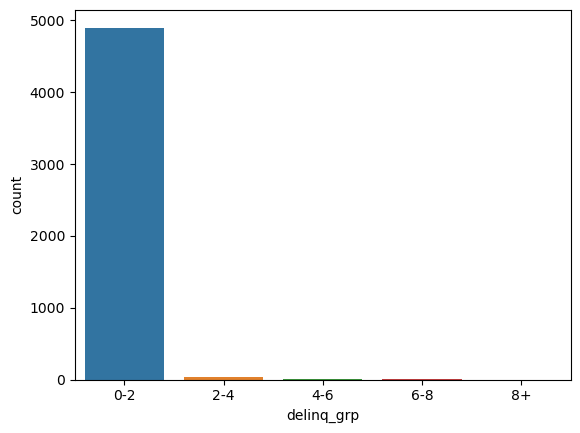

In [75]:
sns.countplot(x='delinq_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'YES'])

<AxesSubplot:xlabel='delinq_grp', ylabel='count'>

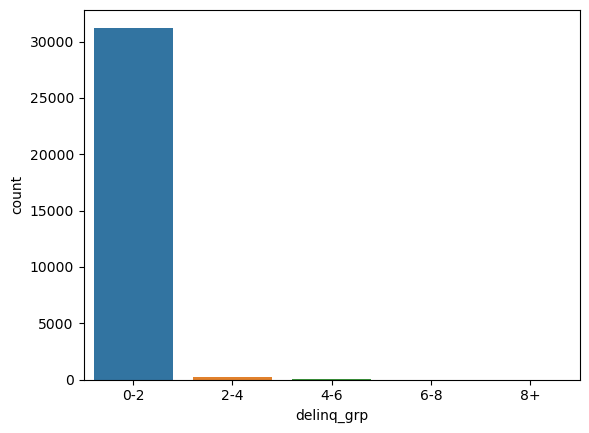

In [76]:
sns.countplot(x='delinq_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'NO'])

### Checking inquiry levels by segment

<AxesSubplot:xlabel='inq_grp', ylabel='count'>

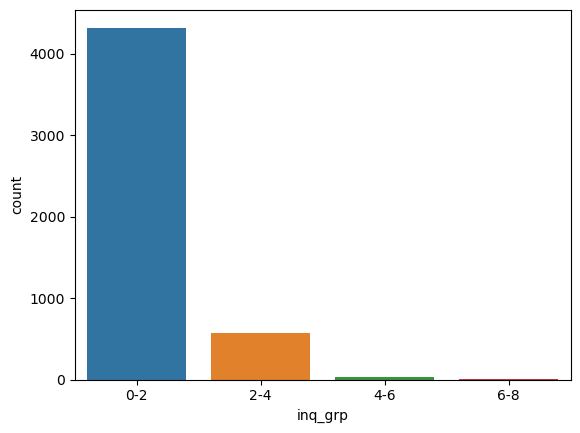

In [77]:
sns.countplot(x='inq_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'YES'])

<AxesSubplot:xlabel='inq_grp', ylabel='count'>

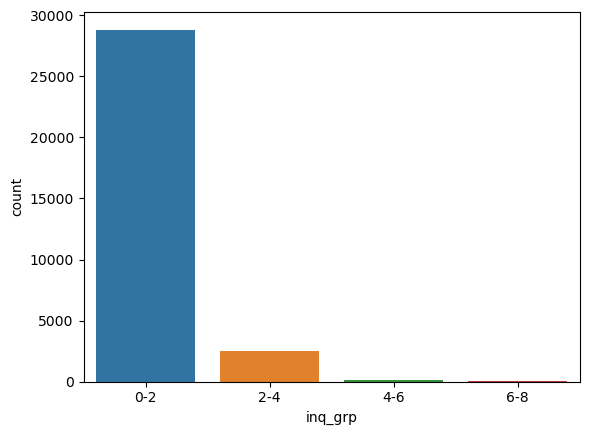

In [78]:
sns.countplot(x='inq_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'NO'])

### Checking total no of credit lines levels by segment¶

<AxesSubplot:xlabel='total_acc_grp', ylabel='count'>

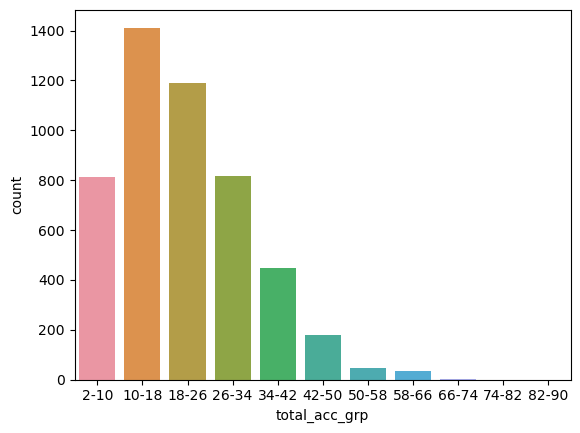

In [79]:
sns.countplot(x='total_acc_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'YES'])

<AxesSubplot:xlabel='total_acc_grp', ylabel='count'>

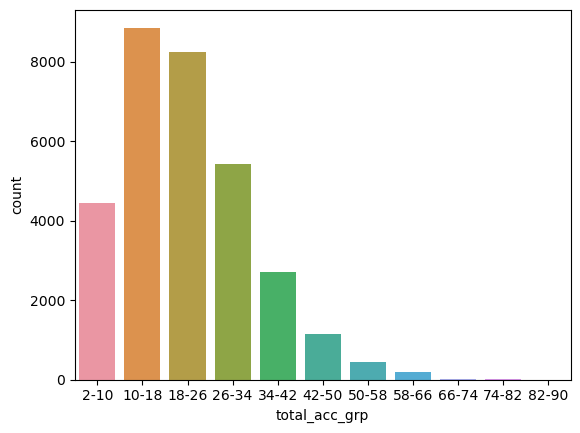

In [80]:
sns.countplot(x='total_acc_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'NO'])

### Checking open credit lines by segment¶

<AxesSubplot:xlabel='open_acc_grp', ylabel='count'>

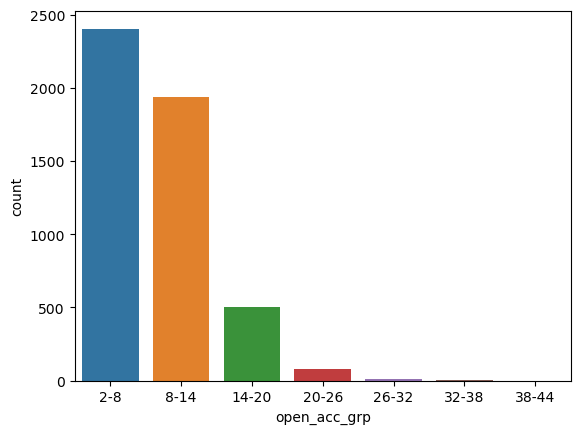

In [81]:
sns.countplot(x='open_acc_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'YES'])

<AxesSubplot:xlabel='open_acc_grp', ylabel='count'>

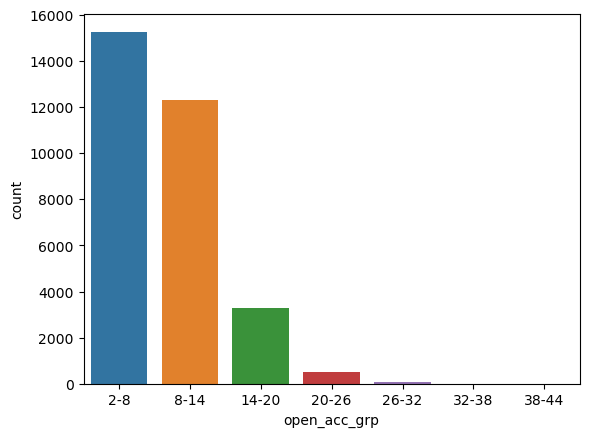

In [82]:
sns.countplot(x='open_acc_grp', data=loan_compliance_data[loan_compliance_data.is_defaulter == 'NO'])

### CONCLUSION: From the above charts, the distribution and proportion of the major compliance metrics are almost similar for both defaulters and non-defaulters. However we have observed that almost equal no of Defaulters tend to have total no of credit lines between the 2-10 and 26-34 buckets, whereas non-defaulters tend to fall more in 26-34 than 2-10. In both the cases however, the vast majority of the applicants tend to have between 10-26 accounts. 

#### Due to a disproportonate dataset, which is largely skewed towards non-defaulters we would be choosing mean as the aggregation metrics for checking public derogatory and bankruptcy records

### Checking public derogatory and bankruptcy records by delinquency groups

In [83]:
loan_compliance_data.groupby(['is_defaulter','delinq_grp']).agg({'pub_rec':'mean','pub_rec_bankruptcies':'mean'}).dropna()

pub_rec  pub_rec_bankruptcies
is_defaulter delinq_grp                                
NO           0-2         0.049134              0.037899
             2-4         0.032558              0.027907
             4-6         0.111111              0.074074
             6-8         0.750000              0.250000
             8+          0.000000              0.000000
YES          0-2         0.081853              0.063278
             2-4         0.081081              0.027027
             4-6         0.250000              0.250000
             6-8         1.000000              1.000000

### Checking public derogatory and bankruptcy records by inquiry groups

In [84]:
loan_compliance_data.groupby(['is_defaulter','inq_grp']).agg({'pub_rec':'mean','pub_rec_bankruptcies':'mean'})

pub_rec  pub_rec_bankruptcies
is_defaulter inq_grp                                
NO           0-2      0.048101              0.037385
             2-4      0.064620              0.046446
             4-6      0.006944              0.000000
             6-8      0.000000              0.000000
YES          0-2      0.081925              0.063411
             2-4      0.092174              0.069565
             4-6      0.000000              0.000000
             6-8      0.000000              0.000000

### Checking public derogatory and bankruptcy records by groups of total no of credit lines

In [85]:
loan_compliance_data.groupby(['is_defaulter','total_acc_grp']).agg({'pub_rec':'mean','pub_rec_bankruptcies':'mean'}).dropna()

pub_rec  pub_rec_bankruptcies
is_defaulter total_acc_grp                                
NO           2-10           0.043018              0.027252
             10-18          0.056846              0.043086
             18-26          0.057233              0.046441
             26-34          0.043183              0.033627
             34-42          0.037010              0.031458
             42-50          0.029798              0.026293
             50-58          0.025114              0.018265
             58-66          0.005128              0.005128
             66-74          0.000000              0.000000
             74-82          0.000000              0.000000
             82-90          0.000000              0.000000
YES          2-10           0.034398              0.018428
             10-18          0.093484              0.065864
             18-26          0.104114              0.086482
             26-34          0.084663              0.069939
             34-42          0.082774              0.067114
             42-50          0.077778              0.072222
             50-58          0.041667              0.041667
             58-66          0.029412              0.029412
             66-74          0.000000              0.000000

### Checking public derogatory and bankruptcy records by groups of number of open credit lines

In [86]:
loan_compliance_data.groupby(['is_defaulter','open_acc_grp']).agg({'pub_rec':'mean','pub_rec_bankruptcies':'mean'}).dropna()

pub_rec  pub_rec_bankruptcies
is_defaulter open_acc_grp                                
NO           2-8           0.048988              0.036479
             8-14          0.050317              0.040091
             14-20         0.045070              0.036903
             20-26         0.047985              0.032630
             26-32         0.098361              0.049180
             32-38         0.000000              0.000000
             38-44         0.000000              0.000000
YES          2-8           0.069496              0.049938
             8-14          0.086643              0.068592
             14-20         0.123752              0.103792
             20-26         0.112500              0.100000
             26-32         0.066667              0.066667
             32-38         0.000000              0.000000

#### CONCLUSION: From the above results we can come to the following conclusion that on an average the defaulters are more likely to have derogatory public records and bankruptcies, across delinquencies, inquiries and the number of credit lines present

In [87]:
#checking the dataset again
loan_clean.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_bal,revol_util,total_acc,out_prncp,total_pymnt,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,is_defaulter,is_income_src_verified
1,2500,60 months,15.27,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,0,5,3,0,1687,9.4,4,0.00,1008.71,456.46,435.17,0.00,117.08,1.11,119.66,0.0,YES,Source Verified
3,10000,36 months,13.49,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,0,1,10,0,5598,21.0,37,0.00,12231.89,10000.00,2214.92,16.97,0.00,0.00,357.48,0.0,NO,Source Verified
4,3000,60 months,12.69,67.79,B,B5,1 year,RENT,80000.0,Source Verified,Current,other,OR,17.94,0,0,15,0,27783,53.9,38,524.06,3513.33,2475.94,1037.39,0.00,0.00,0.00,67.79,0.0,NO,Source Verified
5,5000,36 months,7.90,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,0,3,9,0,7963,28.3,12,0.00,5632.21,5000.00,632.21,0.00,0.00,0.00,161.03,0.0,NO,Source Verified
6,7000,60 months,15.96,170.08,C,C5,8 years,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,0,1,7,0,17726,85.6,11,0.00,10110.84,6985.61,3125.23,0.00,0.00,0.00,1313.76,0.0,NO,Source Not Verified


## CHECKING CORRELATION BETWEEN DIFFERENT METRICS

### Checking correlation between interest rate and dti for default loans

In [88]:
#checking correlation between interest rate and dti for default loans
fig = px.scatter(default_loans, x="int_rate", y="dti",title="Correlation between DTI and Interest rates",size="annual_inc",color="loan_amnt")
fig.show()

### Checking correlation between interest rate and loan amount for default loans¶

In [89]:
#checking correlation between interest rate and loan amount for default loans
fig = px.scatter(default_loans, x="int_rate", y="loan_amnt",title="Correlation between Interest Rates and Loan Amount",size="annual_inc",color="dti")
fig.show()

### Checking correlation between interest rate and annual income for default loans¶

In [90]:
#checking correlation between annual income and interest rate for default loans
fig = px.scatter(default_loans, x="annual_inc", y="int_rate",title="Correlation between Annual Income and Interest rate",size="loan_amnt",color="dti")
fig.show()

### Checking correlation between interest rate and annual income for non-default loans

In [91]:
#checking correlation between annual income and interest rate for non-default loans
fig = px.scatter(loan_non_defaulter, x="annual_inc", y="int_rate",title="Correlation between Annual Income and Interest rate",size="loan_amnt",color="dti")
fig.show()

### Checking correlation between credit utilization rate and loan amount for default loans

In [92]:
#checking correlation between credit utilization rate and loan amount for default loans
fig = px.scatter(
    loan_defaulter, 
    x="revol_util", y="loan_amnt",
    title="Correlation between Credit utilization rate and Loan amount",
    size="annual_inc",color="dti")
fig.show()

### Checking correlation between credit utilization rate and loan amount for non-default loans

In [93]:
#checking correlation between credit utilization rate and loan amount for non-default loans
fig = px.scatter(
    loan_non_defaulter, 
    x="revol_util", y="loan_amnt",
    title="Correlation between Credit utilization rate and Loan amount",
    size="annual_inc",color="dti")
fig.show()

### CONCLUSION: From the above charts here we can draw the following conclusions:
- Defaulters with lower annual income take on higher loans with higher interest rates as compared to their higher annual income counterparts
- Most defaulters are having annual income below USD 300k, while most non-defaulters can earn upto 1M (with outliers of course)

### Checking the correlation between the following metrics together
- loan_amnt
- int_rate
- installment
- annual_inc
- revol_util
- total_pymnt
- total_rec_prncp
- total_rec_int
- last_pymnt_amnt

In [94]:
#Listing the columns
corr_cols =['int_rate','annual_inc','revol_util','last_pymnt_amnt','loan_amnt','total_pymnt','installment','total_rec_prncp','total_rec_int']

In [95]:
#Generating correlation matrix for default loans
d_loan_corr = loan_defaulter[corr_cols].corr()

In [96]:
#Generating correlation matrix for non-default loans
nd_loan_corr = loan_non_defaulter[corr_cols].corr()

#### Visualizing Correlation Matrix for defaulters

<AxesSubplot:>

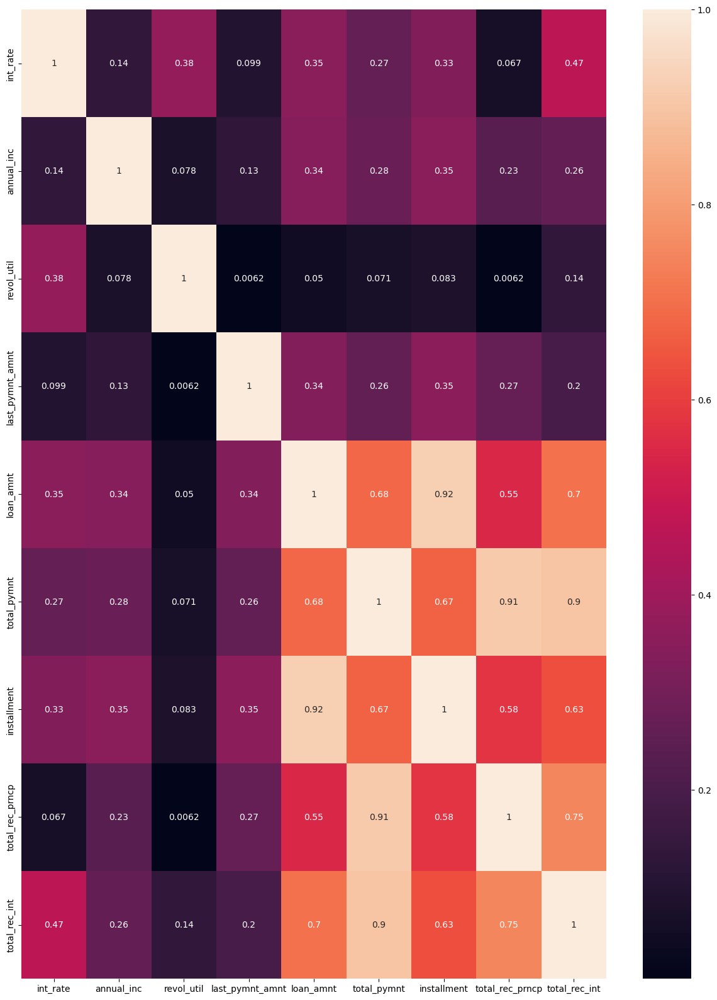

In [97]:
plt.figure(figsize=(15,20))
sns.heatmap(d_loan_corr,annot=True)

#### Visualizing Correlation Matrix for non-defaulters

<AxesSubplot:>

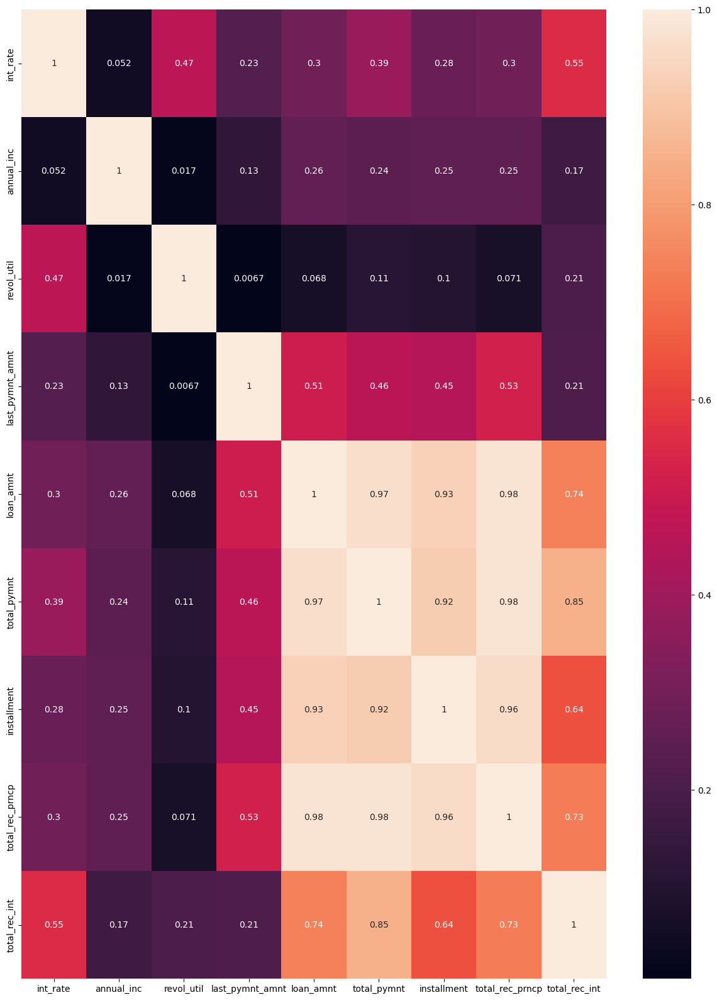

In [98]:
plt.figure(figsize=(15,20))
sns.heatmap(nd_loan_corr,annot=True)

### CONCLUSION: 
#### While comparing the matrices it is observed that 
- for defaulters there is lower correlation between _loan_amount_ ,_installment_, _total_rec_prncp_ and _total_pymnt_ than non-defaulters where they are highly, almost perfectly corelated

## Finally, we can conclude that the following parameters play an important role in determining how likely debtors can default on their loans:
### 1. Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit. If the rate is above 60% then it is clearly problematic
### 2. Annual income for defaulters is slightly lower than that of non-defaulters. Any application coming from within or below the USD 300K per annum income bracket should be thoroughly examined before approval
### 3. DTI (Debt to Income) ratio for defaulters is around 4% higher at the peak than that of non-defaulters. DTI ratio is calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income. Therefore applications with higher DTIs (> 16%) should be thoroughly examined before approval
### 4. Defaulters are 20% more likely to avail a 60 month loan-term than non-defaulters, as compared to a 36 month loan-term
### 5. Defaulters are also 3.4% more likely to stay in rented houses than in privately owned or mortgaged houses
### 6. Defaulters tend to pay a greater rate of interest (2-5% more) on their loans than the non-defaulters pay for the same. They also tend to go more for higher loan amounts
### 7. The leading purpose for availing a loan for defaulters are _Debt consolidation_ and _Others (unlisted reasons)_
### 8. Defaulters tend to belong more to lower employment grades such as C,D,E etc. Although B is the dominant grade for both, the next highest number of takers are from C, D and E in defaulters while it is from A in non-defaulters. Therefore, applications from lower grades for higher loan amounts must be examined thoroughly
### 9. California and New York remain the top 2 dominant states in terms of number of applications received, in both the cases. However, the third highest number of applicants for defaulters are from Florida as compared to Texas for non-defaulters. In case of defaulters the numbers are almost at par with that of New York
### 10. Almost equal no of Defaulters tend to have total no of credit lines between the 2-10 and 26-34 buckets, whereas non-defaulters tend to fall more in 26-34 than 2-10. In both the cases however, the vast majority of the applicants tend to have between 10-26 accounts.
### 11. From the above results we can come to the following conclusion that on an average the defaulters are more likely to have derogatory public records and bankruptcies, across delinquencies, inquiries and the number of credit lines present
### 12. For defaulters there is lower correlation between the listed amount of the loan applied for by the borrower , the monthly installment amount, the principal received to date and the payments received to date for total amount funded than non-defaulters where they are highly, almost perfectly correlated. This implies that potential defaulters are fairly irregular in fulfilling their credit repayment obligations



#### THE END